# Some basic librosa functions

start with instaling these packages:
```
jupyter (so that we have the correct kernel version)
librosa
pandas
matplotlib
```

In [32]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np
import soundfile as sf
import IPython.display as ipd

## our song

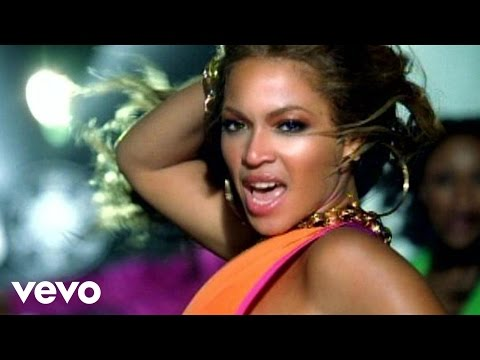

In [5]:
ipd.YouTubeVideo('ViwtNLUqkMY')

In [76]:
fname = '../data/CrazyInLove.mp3'
y, sr = librosa.load(fname, duration=120)


# And compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y))

Listen!

In [10]:
ipd.Audio(fname)

Plot a 5-second slice of the spectrum

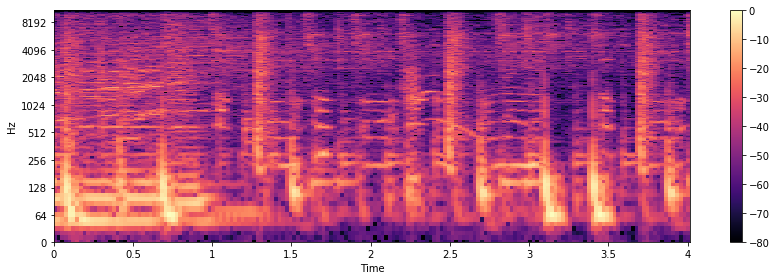

In [21]:
idx = slice(*librosa.time_to_frames([14, 18], sr=sr))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.colorbar()
plt.tight_layout()

### extract chroma frequencies

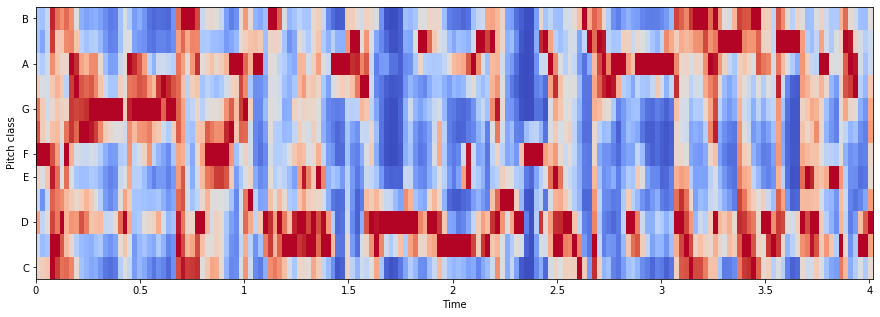

In [23]:
hop_length = 512
chromagram = librosa.feature.chroma_stft(y, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram[:,idx], x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')


In [15]:
print(type(chromagram))
print(chromagram.shape)

<class 'numpy.ndarray'>
(12, 5168)


plot correlation

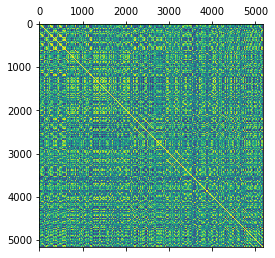

In [14]:
import pandas as pd
df = pd.DataFrame(chromagram)
plt.matshow(df.corr())
plt.show()

### try RQA for sequence alignment

In [44]:
def my_rqa(chroma_stack1, chroma_stack_ref):
    # calc and plor RQA
    
    # calc similarity
    sim = librosa.segment.cross_similarity(chroma_stack1, chroma_stack_ref, 
                                        mode='affinity',
                                        metric='cosine')
    # New gaps cost 5, extending old gaps cost 10 for each step
    score, path = librosa.sequence.rqa(sim, 5, 10)
    best_score = score.max()

    plt.figure(figsize=(10, 4))
    plt.subplot(1,2,1)
    librosa.display.specshow(sim, x_axis='frames', y_axis='frames')
    plt.title('Similarity matrix')
    plt.colorbar()
    plt.subplot(1,2,2)
    librosa.display.specshow(score, x_axis='frames', y_axis='frames')
    plt.title(f'Alignment score matrix ({best_score})')
    plt.plot(path[:, 1], path[:, 0], label='Optimal path', color='c')
    plt.colorbar()
    plt.legend()
    plt.show()
    return best_score, score, path

seconds 14-18 are almost identical to 19-23 (repetition)

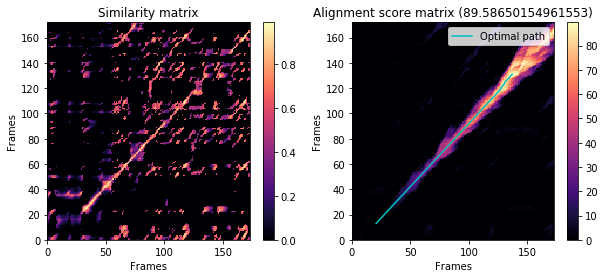

In [45]:
idx14_18 = slice(*librosa.time_to_frames([14, 18], sr=sr))
idx19_23 = slice(*librosa.time_to_frames([19, 23], sr=sr))
idx25_29 = slice(*librosa.time_to_frames([25, 29], sr=sr))

# seconds 14-18 are similar to 19-23

# Use time-delay embedding to reduce noise
chroma_cqt = librosa.feature.chroma_cqt(y=y, sr=sr)
chroma_stack = librosa.feature.stack_memory(chroma_cqt, n_steps=3)
# build similarity matrix
res1 = my_rqa(chroma_stack[:,idx14_18], chroma_stack[:,idx19_23])


seconds 14-18 and 25-29 aren't as similar

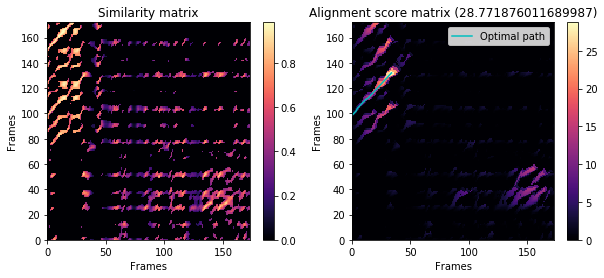

In [46]:
res2 = my_rqa(chroma_stack[:,idx14_18], chroma_stack[:,idx25_29])


try without stacking

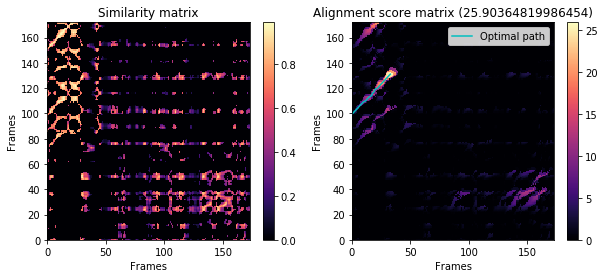

In [78]:
res2 = my_rqa(chroma_cqt[:,idx14_18], chroma_cqt[:,idx25_29])

Works!

try similarity to a different song 

In [54]:
f2 = '../data/music-from-youtube/Jennifer Lopez - If You Had My Love (Official Video)-lYfkl-HXfuU/Jennifer Lopez - If You Had My Love (Official Video)-lYfkl-HXfuU.webm.mp3'
ipd.Audio(f2)

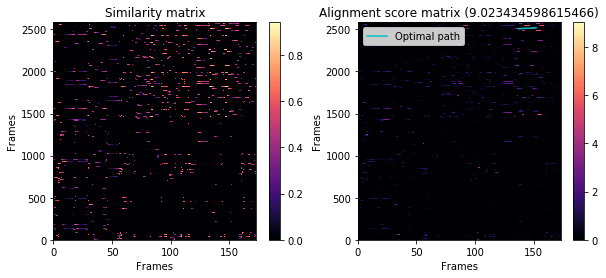

In [79]:
y2, sr2 = librosa.load(f2, duration=120)

chroma_cqt2 = librosa.feature.chroma_cqt(y=y2, sr=sr2)
chroma_stack2 = librosa.feature.stack_memory(chroma_cqt2, n_steps=3)
# compare 4 seconds to song2
idx60 = slice(*librosa.time_to_frames([0, 60], sr=sr))
res4 = my_rqa(chroma_stack[:,idx14_18], chroma_stack2[:,idx60])


Didn't go so well (too dissimilar). let's look for a better feature

In [62]:
spectral_novelty = librosa.onset.onset_strength(y, sr=sr)

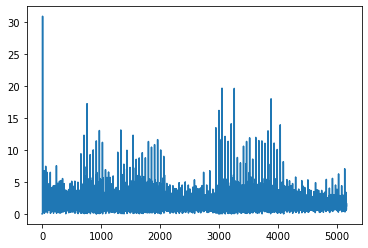

In [77]:
plt.plot(spectral_novelty)

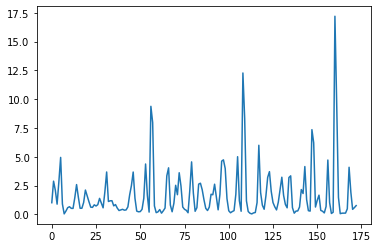

In [64]:
plt.plot(spectral_novelty[idx14_18])

In [65]:
dtempo = librosa.beat.tempo(onset_envelope=spectral_novelty, sr=sr, aggregate=None)
dtempo

/Users/arkin/private/datahack/venv_datahack/lib/python3.7/site-packages/librosa/beat.py:309: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  hop_length=hop_length))


array([95.703125  , 95.703125  , 95.703125  , ..., 99.38401442,
       99.38401442, 99.38401442])

/Users/arkin/private/datahack/venv_datahack/lib/python3.7/site-packages/librosa/beat.py:309: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  hop_length=hop_length))
/Users/arkin/private/datahack/venv_datahack/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  


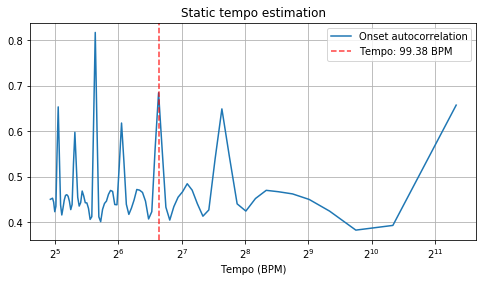

In [70]:
tempo = librosa.beat.tempo(onset_envelope=spectral_novelty, sr=sr)
tempo = np.asscalar(tempo)
# Compute 2-second windowed autocorrelation
hop_length = 512
ac = librosa.autocorrelate(spectral_novelty, 2 * sr // hop_length)
freqs = librosa.tempo_frequencies(len(ac), sr=sr,
                                  hop_length=hop_length)
# Plot on a BPM axis.  We skip the first (0-lag) bin.
plt.figure(figsize=(8,4))
plt.semilogx(freqs[1:], librosa.util.normalize(ac)[1:],
             label='Onset autocorrelation', basex=2)
plt.axvline(tempo, 0, 1, color='r', alpha=0.75, linestyle='--',
           label='Tempo: {:.2f} BPM'.format(tempo))
plt.xlabel('Tempo (BPM)')
plt.grid()
plt.title('Static tempo estimation')
plt.legend(frameon=True)
plt.axis('tight')
plt.show()

In [82]:
zcross = librosa.feature.zero_crossing_rate(y)

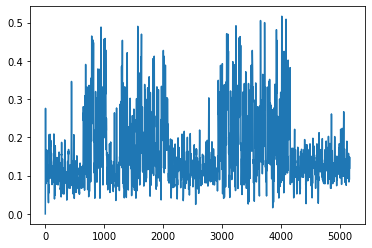

In [88]:
plt.plot(zcross[0,:])

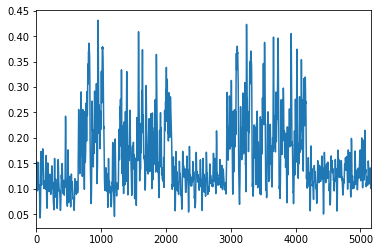

In [98]:
z=pd.Series(zcross[0,:])
z.rolling(9).mean().plot()